# Prediccion de series temporales con RNN, LSTM y GRU
## Dataset: ElectricityLoadDiagrams20112014 (UCI)

Este cuadernillo tiene dos partes bien diferenciadas:

1. **Preprocesamiento**: descargar el dataset real de consumo electrico, limpiarlo, elegirle
   un subconjunto de clientes y de fechas que cumpla con los requisitos de tamano que nos pidieron
   (mas de 20 variables de entrada y mas de 20.000 muestras de entrenamiento), normalizarlo y
   convertirlo en ventanas deslizantes listas para entrenar una red recurrente.
2. **Entrenamiento y comparacion**: usando como base el notebook `rnn_forecast` que ya
   conociamos (el de las series sinteticas) y el cuadernillo guia de optimizacion y
   regularizacion, entrenamos tres arquitecturas -RNN simple, LSTM y GRU- sobre los mismos datos,
   con la misma receta de entrenamiento, y comparamos cual generaliza mejor.

Todo el entrenamiento esta pensado para correr en local sobre una GPU con 8 GB de VRAM
(RTX 4070). Por eso se usan tamanos de batch moderados y precision mixta (`torch.cuda.amp`),
para no quedarnos sin memoria de video durante el entrenamiento.

**Sobre los tamanos pedidos:** llamamos `n` al numero de variables de entrada en cada paso
temporal (en este caso, el numero de clientes/columnas que usamos como features), y `m`/`o` al
numero de muestras de entrenamiento generadas por ventanas deslizantes (cada ventana produce un
par entrada-salida, por eso el numero de muestras de entrada `m` coincide con el numero de
muestras de salida `o`). El objetivo de este preprocesamiento es terminar con `n > 20` y
`m = o > 20000`.


# PARTE 1 - Preprocesamiento

## 1.1 Sobre`ElectricityLoadDiagrams20112014` el dataset

 es un dataset publico del repositorio de UCI. Contiene el
consumo electrico de 370 clientes (empresas y hogares), registrado cada 15 minutos, entre los
anos 2011 y 2014. Cada columna es un cliente distinto (`MT_001`, `MT_002`, ...) y cada fila es
una marca de tiempo. Muchos clientes no estuvieron monitorizados desde el primer dia, asi que
sus columnas arrancan en cero hasta que el contador se instala; eso hay que detectarlo y
filtrarlo, si no metemos ruido falso en el entrenamiento.

Vamos a usar varios clientes a la vez como variables de entrada (un problema de series
temporales **multivariado**): en cada paso de tiempo la red ve el consumo de todos los clientes
seleccionados, y aprende a predecir el consumo del siguiente paso para todos ellos a la vez.


**Datos del Proyecto**

* **Estudiante:** Claudia Pereira Cuba
* **Materia:** SIS421
* **Laboratorio:** Lab 3 — RNN GRU LSTM 
* **Dataset:** [**Datos del Proyecto**

* **Estudiante:** Claudia Pereira Cuba
* **Materia:** SIS421
* **Laboratorio:** Lab 2 — CNN preentrenado (Xception)
* **Dataset:** [](https://zenodo.org/records/12554005)
* **GitHub:** [Repositorio Laboratorio 2](https://github.com/cpereiracuba/Laboratorio-2-ia/tree/main/LAB-2.1-INSECTOS/00__Entrenamiento_xception_insectos_.ipynb)
* **Video:** [Google Drive - Presentación](https://drive.google.com/drive/folders/1_l1vq17tjytRpaLuqzRr1lQCE8nC1Sgr?usp=drive_link)](https://zenodo.org/records/12554005)
* **GitHub:** [Repositorio Laboratorio 2](https://github.com/cpereiracuba/Laboratorio-2-ia/tree/main/LAB-2.1-INSECTOS/00__Entrenamiento_xception_insectos_.ipynb)
* **Video:** [Google Drive - Presentación](https://drive.google.com/drive/folders/1_l1vq17tjytRpaLuqzRr1lQCE8nC1Sgr?usp=drive_link)

In [10]:
# Librerias necesarias para todo el preprocesamiento.
# requests y zipfile son para bajar y descomprimir el dataset original desde UCI.
# pandas se usa para cargar y manipular la tabla de consumos.
# numpy para el trabajo numerico (ventanas deslizantes, arrays).
# sklearn.preprocessing para normalizar los datos antes de meterlos a la red.
# matplotlib para inspeccionar visualmente las series antes de entrenar nada.

import os
import zipfile
import requests

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler

# Fijamos una semilla general para que el preprocesamiento sea reproducible
# (el orden de seleccion de clientes, por ejemplo, depende de un muestreo aleatorio).
SEED = 42
np.random.seed(SEED)

# Carpeta local donde vamos a guardar el dataset descargado y los archivos que generemos.
DATA_DIR = "data"
os.makedirs(DATA_DIR, exist_ok=True)


## 1.2 Descarga del dataset

El archivo original pesa varios cientos de MB comprimido, asi que solo lo descargamos si no
esta ya en disco. La UCI distribuye el dataset como un `.zip` que contiene un unico archivo de
texto (`LD2011_2014.txt`), separado por punto y coma y con la coma como separador decimal (es
un dataset europeo), asi que hay que decirle eso a pandas al leerlo.


In [11]:
# URL oficial del dataset en el repositorio de UCI Machine Learning.
URL_DATASET = "https://archive.ics.uci.edu/static/public/321/electricityloaddiagrams20112014.zip"

ZIP_PATH = os.path.join(DATA_DIR, "electricityloaddiagrams20112014.zip")
TXT_PATH = os.path.join(DATA_DIR, "LD2011_2014.txt")

def descargar_dataset(url=URL_DATASET, zip_path=ZIP_PATH, txt_path=TXT_PATH):
    """Descarga y descomprime el dataset si todavia no lo tenemos en disco.

    Si el archivo de texto ya existe no hace nada, para no perder tiempo
    volviendo a descargar varios cientos de MB cada vez que se reinicia el kernel.
    """

    if os.path.exists(txt_path):
        print("El dataset ya esta descomprimido en:", txt_path)
        return txt_path

    # CAMBIO: comprobamos que el ZIP exista Y que sea un ZIP valido
    if not os.path.exists(zip_path) or not zipfile.is_zipfile(zip_path):

        # Si existe pero esta dañado, lo eliminamos
        if os.path.exists(zip_path):
            print("El archivo ZIP existente no es valido. Se eliminara.")
            os.remove(zip_path)

        print("Descargando el dataset desde UCI, puede tardar unos minutos...")

        # stream=True para no cargar el archivo completo en memoria de una sola vez
        respuesta = requests.get(url, stream=True, timeout=60)
        respuesta.raise_for_status()

        with open(zip_path, "wb") as f:
            for chunk in respuesta.iter_content(chunk_size=1024 * 1024):
                if chunk:
                    f.write(chunk)

        print("Descarga terminada.")

    print("Descomprimiendo...")

    with zipfile.ZipFile(zip_path, "r") as z:
        z.extractall(DATA_DIR)

    print("Listo, dataset disponible en:", txt_path)

    return txt_path


txt_path = descargar_dataset()

El archivo ZIP existente no es valido. Se eliminara.
Descargando el dataset desde UCI, puede tardar unos minutos...
Descarga terminada.
Descomprimiendo...
Listo, dataset disponible en: data\LD2011_2014.txt


In [12]:
# Cargamos el archivo con pandas.
# sep=';'      -> el separador de columnas es punto y coma, no coma.
# decimal=','  -> los numeros usan coma decimal (por ejemplo "12,345" es 12.345).
# index_col=0  -> la primera columna (la fecha) pasa a ser el indice del DataFrame.
# parse_dates=True -> convierte ese indice a formato de fecha real, no texto.
df = pd.read_csv(txt_path, sep=";", decimal=",", index_col=0, parse_dates=True)
df.index.name = "fecha"

print("Forma del dataset completo (filas, columnas):", df.shape)
df.head()


Forma del dataset completo (filas, columnas): (140256, 370)


,MT_001,MT_002,MT_003,MT_004,MT_005,MT_006,MT_007,MT_008,MT_009,MT_010,...,MT_361,MT_362,MT_363,MT_364,MT_365,MT_366,MT_367,MT_368,MT_369,MT_370
fecha,,,,,,,,,,,,,,,,,,,,,
2011-01-01 00:15:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2011-01-01 00:30:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2011-01-01 00:45:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2011-01-01 01:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2011-01-01 01:15:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## 1.3 Exploracion inicial

Antes de tocar el modelo, seguimos el primer paso de la guia: entender que tenemos entre manos.
Miramos cuantos clientes hay, si hay huecos, y sobre todo cuantos ceros tiene cada columna al
principio de la serie (eso nos dice si el cliente estaba realmente monitorizado desde el
arranque del dataset o si esos ceros son en realidad datos faltantes disfrazados).


In [13]:
# Estadisticos generales del dataset completo: nos da una primera idea de escala
# (algunos clientes consumen mucha mas energia que otros) y de posibles valores raros.
resumen = df.describe().T[["mean", "std", "min", "max"]]
print("Numero total de clientes (columnas):", df.shape[1])
print("Rango de fechas:", df.index.min(), "->", df.index.max())
resumen.head(10)


Numero total de clientes (columnas): 370
Rango de fechas: 2011-01-01 00:15:00 -> 2015-01-01 00:00:00


,mean,std,min,max
MT_001,3.970785,5.983965,0.0,48.223350
MT_002,20.768480,13.272415,0.0,115.220484
MT_003,2.918308,11.014456,0.0,151.172893
MT_004,82.184490,58.248392,0.0,321.138211
MT_005,37.240309,26.461327,0.0,150.000000
MT_006,141.227385,98.439984,0.0,535.714286
MT_007,4.521338,6.485684,0.0,44.657999
MT_008,191.401476,121.981187,0.0,552.188552
MT_009,39.975354,29.814595,0.0,157.342657
MT_010,42.205152,33.401251,0.0,198.924731


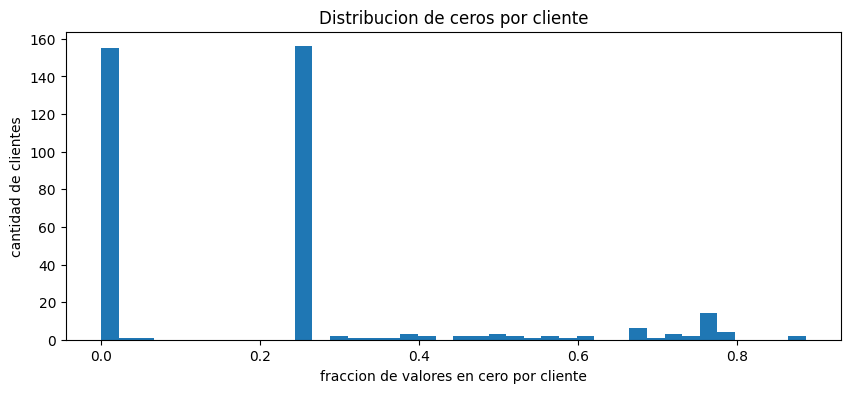

Clientes con menos de 1% de ceros: 154
Clientes con mas de 30% de ceros: 56


In [14]:
# Fraccion de valores que son exactamente cero, por cliente.
# Un cliente con muchos ceros al principio del periodo probablemente no estaba
# conectado todavia, y esos ceros no representan consumo real: son ausencia de dato.
fraccion_ceros = (df == 0).mean().sort_values()

plt.figure(figsize=(10, 4))
plt.hist(fraccion_ceros, bins=40)
plt.xlabel("fraccion de valores en cero por cliente")
plt.ylabel("cantidad de clientes")
plt.title("Distribucion de ceros por cliente")
plt.show()

print("Clientes con menos de 1% de ceros:", (fraccion_ceros < 0.01).sum())
print("Clientes con mas de 30% de ceros:", (fraccion_ceros > 0.30).sum())


## 1.4 Seleccion de clientes (features)

Nos quedamos solo con los clientes que tienen datos limpios en todo el periodo (muy poca
proporcion de ceros), y de ese grupo elegimos un subconjunto al azar para nuestras variables de
entrada. Necesitamos mas de 20, asi que pedimos algunos de mas por si alguno termina
descartado en pasos posteriores.


In [15]:
# Umbral de tolerancia: descartamos clientes con mas de 1% de lecturas en cero,
# porque eso suele indicar que no estuvieron conectados durante todo el periodo.
UMBRAL_CEROS = 0.01
clientes_validos = fraccion_ceros[fraccion_ceros < UMBRAL_CEROS].index.tolist()
print("Clientes que pasan el filtro de calidad:", len(clientes_validos))

# De los clientes validos elegimos 25 al azar (dejamos margen sobre el minimo de 20
# que pide el enunciado, por si mas adelante alguno se descarta por otro motivo).
N_CLIENTES = 25
rng = np.random.default_rng(SEED)
clientes_seleccionados = sorted(rng.choice(clientes_validos, size=N_CLIENTES, replace=False))

print("Clientes seleccionados como variables de entrada (n =", len(clientes_seleccionados), "):")
print(clientes_seleccionados)

df_sel = df[clientes_seleccionados].copy()
df_sel.shape


Clientes que pasan el filtro de calidad: 154
Clientes seleccionados como variables de entrada (n = 25 ):
[np.str_('MT_158'), np.str_('MT_161'), np.str_('MT_162'), np.str_('MT_169'), np.str_('MT_171'), np.str_('MT_172'), np.str_('MT_191'), np.str_('MT_196'), np.str_('MT_197'), np.str_('MT_205'), np.str_('MT_206'), np.str_('MT_207'), np.str_('MT_210'), np.str_('MT_220'), np.str_('MT_226'), np.str_('MT_261'), np.str_('MT_268'), np.str_('MT_272'), np.str_('MT_274'), np.str_('MT_279'), np.str_('MT_287'), np.str_('MT_295'), np.str_('MT_310'), np.str_('MT_312'), np.str_('MT_318')]


(140256, 25)

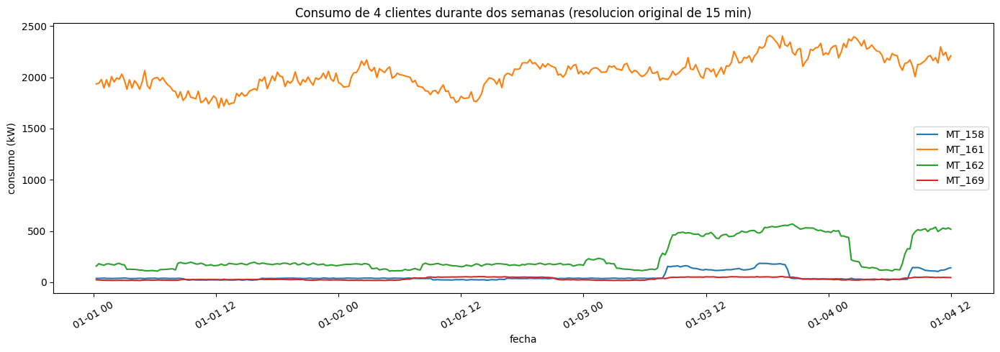

In [16]:
# Inspeccion visual rapida: graficamos un par de semanas de un puñado de clientes
# para confirmar que las series tienen la forma esperada (patrones diarios/semanales,
# sin huecos raros ni valores disparatados).
plt.figure(figsize=(14, 5))
ventana_visual = df_sel.iloc[:24 * 14]  # dos semanas a resolucion de 15 minutos
for col in clientes_seleccionados[:4]:
    plt.plot(ventana_visual.index, ventana_visual[col], label=col)
plt.legend()
plt.title("Consumo de 4 clientes durante dos semanas (resolucion original de 15 min)")
plt.xlabel("fecha")
plt.ylabel("consumo (kW)")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()


## 1.5 Remuestreo a resolucion horaria

Los datos originales vienen cada 15 minutos, lo que da mas de 140.000 filas en total. Es mucho
volumen para entrenar en local sin necesidad: bajamos la resolucion a **una muestra por hora**
promediando los 4 valores de cada hora. Esto reduce el ruido de corto plazo, hace el
entrenamiento mas liviano en la GPU, y de todas formas nos deja de sobra por encima de las
20.000 muestras que necesitamos, porque el dataset cubre casi cuatro anos completos.


In [17]:
# resample('1h') agrupa las filas de cada hora y .mean() promedia los 4 valores de 15 min.
df_hora = df_sel.resample("1h").mean()

# Por si el remuestreo deja algun hueco puntual (por ejemplo un cambio de hora),
# rellenamos hacia adelante y hacia atras: son casos aislados, no un problema estructural.
n_nulos_antes = df_hora.isna().sum().sum()
df_hora = df_hora.ffill().bfill()
n_nulos_despues = df_hora.isna().sum().sum()

print("Valores nulos antes de rellenar:", n_nulos_antes)
print("Valores nulos despues de rellenar:", n_nulos_despues)
print("Forma tras remuestrear a resolucion horaria:", df_hora.shape)


Valores nulos antes de rellenar: 0
Valores nulos despues de rellenar: 0
Forma tras remuestrear a resolucion horaria: (35065, 25)


## 1.6 Division temporal en train / val / test

En series temporales **no** se puede hacer un split aleatorio como en un problema tabular
comun: si mezclamos fechas al azar, el modelo terminaria viendo "el futuro" durante el
entrenamiento y validando con datos que en realidad son anteriores a los de entrenamiento, lo
cual falsea por completo la evaluacion. La forma correcta es cortar la linea de tiempo en tres
tramos consecutivos: el primero para entrenar, el siguiente para validar, y el ultimo (el mas
reciente) para el test final.

Usamos un reparto 70% / 15% / 15%, cortando por fecha y no por proporcion aleatoria de filas.


In [18]:
# Cortamos el DataFrame ya remuestreado en tres tramos consecutivos en el tiempo.
n_total = len(df_hora)
n_train = int(n_total * 0.70)
n_val = int(n_total * 0.15)
# el resto (aprox. 15%) se lo llevamos al test, para no perder muestras por redondeo

df_train = df_hora.iloc[:n_train]
df_val = df_hora.iloc[n_train:n_train + n_val]
df_test = df_hora.iloc[n_train + n_val:]

print("Train:", df_train.shape, df_train.index.min(), "->", df_train.index.max())
print("Val:  ", df_val.shape, df_val.index.min(), "->", df_val.index.max())
print("Test: ", df_test.shape, df_test.index.min(), "->", df_test.index.max())


Train: (24545, 25) 2011-01-01 00:00:00 -> 2013-10-19 16:00:00
Val:   (5259, 25) 2013-10-19 17:00:00 -> 2014-05-26 19:00:00
Test:  (5261, 25) 2014-05-26 20:00:00 -> 2015-01-01 00:00:00


## 1.7 Normalizacion

Cada cliente tiene una escala de consumo distinta (unos consumen decenas de kW, otros
cientos), y las redes recurrentes entrenan mucho mejor cuando todas las variables de entrada
estan en rangos parecidos. Usamos `StandardScaler` (resta la media y divide entre la
desviacion estandar), y algo importante: el scaler se **ajusta unicamente con los datos de
entrenamiento**. Si lo ajustaramos con todo el dataset estariamos filtrando informacion del
futuro (val y test) hacia el entrenamiento, lo que se conoce como *data leakage*.


In [19]:
# Ajustamos el escalador solo con el tramo de entrenamiento...
scaler = StandardScaler()
scaler.fit(df_train.values)

# ...y lo aplicamos por igual a los tres tramos, usando siempre la misma media/desviacion
# aprendida en train. Esto simula la situacion real: en produccion nunca vamos a conocer
# de antemano la media exacta de los datos futuros.
train_scaled = scaler.transform(df_train.values).astype(np.float32)
val_scaled = scaler.transform(df_val.values).astype(np.float32)
test_scaled = scaler.transform(df_test.values).astype(np.float32)

print("Media aprendida (primeros 5 clientes):", scaler.mean_[:5])
print("Desviacion aprendida (primeros 5 clientes):", scaler.scale_[:5])


Media aprendida (primeros 5 clientes): [  74.42102091 1887.8046286   292.87705379   39.77682429  253.43851583]
Desviacion aprendida (primeros 5 clientes): [ 54.51629361 358.85935292 142.54091323  11.235164    62.61677024]


## 1.8 Ventanas deslizantes (sliding windows)

Una red recurrente no recibe la serie completa de una sola vez: recibe una ventana de los
ultimos `n_steps` pasos temporales y aprende a predecir el paso siguiente. Convertimos cada
tramo (train, val, test) en un conjunto de ventanas independientes, deslizando de a un paso a
la vez sobre la serie.

Usamos `n_steps = 24`, es decir, cada muestra de entrada son las ultimas 24 horas de consumo de
los 25 clientes seleccionados, y el objetivo es predecir el consumo de esos mismos 25 clientes
en la hora siguiente. Por eso cada ventana de entrada `X` tiene forma
`(n_steps, n_clientes)` y cada objetivo `y` tiene forma `(n_clientes,)`: el numero de muestras
de entrada y de salida es siempre el mismo, ya que se generan en pares.

Importante: las ventanas se generan por separado dentro de cada tramo (train, val, test), nunca
cruzando el limite entre tramos, para no filtrar informacion de un tramo a otro.


In [20]:
def crear_ventanas(datos, n_steps=24):
    """Convierte una matriz (tiempo, n_clientes) en pares (X, y) para entrenar
    a predecir un paso hacia adelante.

    X tiene forma (n_muestras, n_steps, n_clientes): la historia reciente.
    y tiene forma (n_muestras, n_clientes): el valor inmediatamente despues de cada ventana.
    """
    X, y = [], []
    for i in range(len(datos) - n_steps):
        X.append(datos[i:i + n_steps])
        y.append(datos[i + n_steps])
    return np.array(X, dtype=np.float32), np.array(y, dtype=np.float32)

N_STEPS = 24  # 24 horas de historia como entrada

X_train, y_train = crear_ventanas(train_scaled, N_STEPS)
X_val, y_val = crear_ventanas(val_scaled, N_STEPS)
X_test, y_test = crear_ventanas(test_scaled, N_STEPS)

print("X_train:", X_train.shape, " y_train:", y_train.shape)
print("X_val:  ", X_val.shape, " y_val:  ", y_val.shape)
print("X_test: ", X_test.shape, " y_test: ", y_test.shape)


X_train: (24521, 24, 25)  y_train: (24521, 25)
X_val:   (5235, 24, 25)  y_val:   (5235, 25)
X_test:  (5237, 24, 25)  y_test:  (5237, 25)


In [21]:
# Verificacion final de los requisitos de tamano que nos pidieron:
# n  -> numero de variables de entrada (clientes) por paso temporal, debe ser mayor a 20.
# m  -> numero de muestras de entrenamiento (ventanas X), debe ser mayor a 20000.
# o  -> numero de muestras de salida (ventanas y), debe coincidir con m y tambien superar 20000.
n_features = X_train.shape[-1]
m_muestras_train = X_train.shape[0]
o_muestras_train = y_train.shape[0]

print("n (variables de entrada):", n_features)
print("m (muestras de entrada, train):", m_muestras_train)
print("o (muestras de salida, train):", o_muestras_train)

assert n_features > 20, "Se necesitan mas de 20 variables de entrada"
assert m_muestras_train > 20000, "Se necesitan mas de 20000 muestras de entrenamiento"
assert o_muestras_train > 20000, "Se necesitan mas de 20000 muestras de salida"
assert m_muestras_train == o_muestras_train, "m y o deben coincidir, se generan en pares"

print("\nRequisitos cumplidos: n > 20 y m = o > 20000.")


n (variables de entrada): 25
m (muestras de entrada, train): 24521
o (muestras de salida, train): 24521

Requisitos cumplidos: n > 20 y m = o > 20000.


## 1.9 Guardado del dataset preprocesado

Guardamos los arrays ya preprocesados en un unico archivo `.npz`, junto con la lista de
clientes usados y los parametros del escalador. Asi, si en el futuro queremos volver a entrenar
sin repetir todo el preprocesamiento (que incluye la descarga de varios cientos de MB),
simplemente cargamos este archivo.


In [22]:
RUTA_NPZ = os.path.join(DATA_DIR, "electricity_preprocesado.npz")

np.savez_compressed(
    RUTA_NPZ,
    X_train=X_train, y_train=y_train,
    X_val=X_val, y_val=y_val,
    X_test=X_test, y_test=y_test,
    clientes=np.array(clientes_seleccionados),
    scaler_mean=scaler.mean_,
    scaler_scale=scaler.scale_,
    n_steps=N_STEPS,
)

tamano_mb = os.path.getsize(RUTA_NPZ) / (1024 * 1024)
print(f"Dataset preprocesado guardado en {RUTA_NPZ} ({tamano_mb:.1f} MB)")


Dataset preprocesado guardado en data\electricity_preprocesado.npz (6.3 MB)


# PARTE 2 - De numpy a PyTorch

A partir de aca dejamos pandas/numpy de lado y trabajamos con PyTorch. Armamos una clase
`Dataset` que envuelve nuestros arrays y unos `DataLoader` que se encargan de repartir los
datos en batches durante el entrenamiento. Esto es exactamente el mismo patron que usamos en el
notebook de series sinteticas (`rnn_forecast`), solo que ahora los datos vienen del dataset real
en vez de una funcion generadora.


In [23]:
import time
import torch
from torch.utils.data import Dataset, DataLoader

# Verificamos que la GPU este disponible. En una RTX 4070 esto deberia decir "cuda".
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Dispositivo usado para entrenar:", device)
if device == "cuda":
    print("GPU detectada:", torch.cuda.get_device_name(0))


def fijar_semilla(seed=42):
    """Fija todas las semillas relevantes para que los entrenamientos sean reproducibles."""
    import random
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)


fijar_semilla(SEED)


class TimeSeriesDataset(Dataset):
    """Envuelve un par de arrays (X, y) para que PyTorch pueda iterarlos por batches.

    X: ventanas de entrada, forma (n_muestras, n_steps, n_features)
    y: valor objetivo de cada ventana, forma (n_muestras, n_features)
    """

    def __init__(self, X, y):
        # Convertimos a tensores una sola vez, en el constructor, para no repetir
        # esta conversion en cada llamada a __getitem__ (seria mas lento).
        self.X = torch.from_numpy(X)
        self.y = torch.from_numpy(y)

    def __len__(self):
        return len(self.X)

    def __getitem__(self, ix):
        return self.X[ix], self.y[ix]


# Armamos los tres datasets (train / val / test) a partir de los arrays que preprocesamos.
dataset = {
    "train": TimeSeriesDataset(X_train, y_train),
    "val": TimeSeriesDataset(X_val, y_val),
    "test": TimeSeriesDataset(X_test, y_test),
}

# Batch size de partida recomendado por la guia (16/32/64). Mas adelante lo vamos a
# ajustar con la busqueda de hiperparametros.
BATCH_SIZE_INICIAL = 64

dataloader = {
    "train": DataLoader(dataset["train"], batch_size=BATCH_SIZE_INICIAL, shuffle=True),
    "val": DataLoader(dataset["val"], batch_size=BATCH_SIZE_INICIAL, shuffle=False),
    "test": DataLoader(dataset["test"], batch_size=BATCH_SIZE_INICIAL, shuffle=False),
}

print("Batches por epoch en train:", len(dataloader["train"]))


Dispositivo usado para entrenar: cuda
GPU detectada: NVIDIA GeForce RTX 4070 Laptop GPU
Batches por epoch en train: 384


# PARTE 3 - Arquitecturas: RNN simple, LSTM y GRU

Definimos las tres arquitecturas que vamos a comparar. Estan basadas en el mismo esqueleto que
usamos en `rnn_forecast` (una capa recurrente seguida de una capa lineal de salida), con dos
diferencias respecto de aquel notebook:

- Ahora trabajamos con series **multivariadas**: la entrada tiene `n_features` variables por
  paso temporal (los clientes seleccionados) en vez de una sola, y la salida tambien predice
  todas esas variables a la vez, no un unico valor.
- Le agregamos **regularizacion** siguiendo el cuadernillo guia: dropout dentro de la propia
  capa recurrente (cuando hay mas de una capa apilada) y un dropout adicional justo antes de la
  capa de salida, para que la red no dependa en exceso de neuronas puntuales.

Las tres clases son practicamente identicas entre si; la unica diferencia real es que capa de
PyTorch usan por dentro (`nn.RNN`, `nn.LSTM` o `nn.GRU`). Eso es justamente lo que nos interesa
comparar: con el mismo diseno alrededor, y el mismo criterio de entrenamiento, que tanto cambia
el resultado segun la celda recurrente que usemos.


In [24]:
import torch.nn as nn


class RNNForecast(nn.Module):
    """Red recurrente simple para prediccion multivariada de un paso hacia adelante."""

    def __init__(self, n_features, hidden_size=64, num_layers=1, dropout=0.0):
        super().__init__()
        # dropout dentro de nn.RNN solo tiene efecto si num_layers > 1 (se aplica
        # entre capas apiladas, no dentro de una misma capa), PyTorch lo ignora
        # silenciosamente si num_layers=1, asi que es seguro dejarlo siempre puesto.
        self.rnn = nn.RNN(
            input_size=n_features,
            hidden_size=hidden_size,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout if num_layers > 1 else 0.0,
        )
        self.dropout_salida = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_size, n_features)

    def forward(self, x):
        # x: (batch, n_steps, n_features)
        salida, _ = self.rnn(x)
        # nos quedamos solo con el ultimo paso temporal, que es el que resume
        # toda la historia vista hasta ese momento
        ultimo_paso = salida[:, -1]
        ultimo_paso = self.dropout_salida(ultimo_paso)
        return self.fc(ultimo_paso)


class LSTMForecast(nn.Module):
    """Igual que RNNForecast pero con celda LSTM: memoria de largo plazo separada
    del estado oculto, gracias a las compuertas de olvido/entrada/salida."""

    def __init__(self, n_features, hidden_size=64, num_layers=1, dropout=0.0):
        super().__init__()
        self.lstm = nn.LSTM(
            input_size=n_features,
            hidden_size=hidden_size,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout if num_layers > 1 else 0.0,
        )
        self.dropout_salida = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_size, n_features)

    def forward(self, x):
        # nn.LSTM devuelve, ademas de la salida, una tupla (h, C) con el estado
        # oculto y la celda de memoria; para esta tarea solo necesitamos la salida.
        salida, _ = self.lstm(x)
        ultimo_paso = salida[:, -1]
        ultimo_paso = self.dropout_salida(ultimo_paso)
        return self.fc(ultimo_paso)


class GRUForecast(nn.Module):
    """Igual que las anteriores pero con celda GRU: version simplificada de la LSTM,
    con menos parametros y normalmente mas rapida de entrenar."""

    def __init__(self, n_features, hidden_size=64, num_layers=1, dropout=0.0):
        super().__init__()
        self.gru = nn.GRU(
            input_size=n_features,
            hidden_size=hidden_size,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout if num_layers > 1 else 0.0,
        )
        self.dropout_salida = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_size, n_features)

    def forward(self, x):
        salida, _ = self.gru(x)
        ultimo_paso = salida[:, -1]
        ultimo_paso = self.dropout_salida(ultimo_paso)
        return self.fc(ultimo_paso)


ARQUITECTURAS = {
    "RNN": RNNForecast,
    "LSTM": LSTMForecast,
    "GRU": GRUForecast,
}


# PARTE 4 - Validar la red antes de entrenar en serio

Siguiendo la guia, antes de lanzar un entrenamiento largo conviene hacer tres chequeos rapidos
que detectan la mayoria de los errores de implementacion. Los hacemos una vez con la RNN
simple; si estos chequeos pasan con una arquitectura, van a pasar igual con LSTM y GRU porque
comparten exactamente el mismo `forward` alrededor de la celda recurrente.

1. **Dimensiones**: le pasamos un batch de prueba y confirmamos que la salida tiene la forma
   esperada.
2. **Memorizar una sola muestra**: si el modelo no logra bajar la perdida a casi cero con un
   unico ejemplo, hay un error de implementacion en algun lado.
3. **Memorizar un solo batch**: lo mismo pero con un batch completo, con un learning rate algo
   mas agresivo.


In [25]:
# 4.1 - Comprobacion de dimensiones -------------------------------------------------
n_features = X_train.shape[-1]
modelo_prueba = RNNForecast(n_features=n_features, hidden_size=32, num_layers=1).to(device)

entrada_prueba = torch.randn(64, N_STEPS, n_features).to(device)
salida_prueba = modelo_prueba(entrada_prueba)

print("Forma de entrada: ", entrada_prueba.shape)
print("Forma de salida:  ", salida_prueba.shape)
assert salida_prueba.shape == (64, n_features), "La forma de salida no es la esperada"
print("Las dimensiones son correctas.")


Forma de entrada:  torch.Size([64, 24, 25])
Forma de salida:   torch.Size([64, 25])
Las dimensiones son correctas.


In [26]:
# 4.2 - El modelo debe poder memorizar una sola muestra -----------------------------
x_una_muestra, y_una_muestra = dataset["train"][0]
x_una_muestra = x_una_muestra.unsqueeze(0).to(device)   # le agregamos la dimension de batch
y_una_muestra = y_una_muestra.unsqueeze(0).to(device)

modelo_overfit = RNNForecast(n_features=n_features, hidden_size=32).to(device)
optimizador_overfit = torch.optim.Adam(modelo_overfit.parameters(), lr=0.01)
criterio = nn.MSELoss()

for paso in range(200):
    optimizador_overfit.zero_grad()
    pred = modelo_overfit(x_una_muestra)
    loss = criterio(pred, y_una_muestra)
    loss.backward()
    optimizador_overfit.step()

print(f"Loss final tras memorizar una sola muestra: {loss.item():.6f}")
assert loss.item() < 0.01, "El modelo no logra memorizar una sola muestra, revisar la implementacion"
print("Correcto: el modelo es capaz de memorizar una unica muestra.")


Loss final tras memorizar una sola muestra: 0.000000
Correcto: el modelo es capaz de memorizar una unica muestra.


In [27]:
# 4.3 - El modelo debe poder memorizar un solo batch ---------------------------------
x_un_batch, y_un_batch = next(iter(dataloader["train"]))
x_un_batch, y_un_batch = x_un_batch.to(device), y_un_batch.to(device)

modelo_overfit_batch = RNNForecast(n_features=n_features, hidden_size=32).to(device)
optimizador_overfit_batch = torch.optim.Adam(modelo_overfit_batch.parameters(), lr=0.01)

for paso in range(300):
    optimizador_overfit_batch.zero_grad()
    pred = modelo_overfit_batch(x_un_batch)
    loss = criterio(pred, y_un_batch)
    loss.backward()
    optimizador_overfit_batch.step()

print(f"Loss final tras memorizar un batch completo: {loss.item():.6f}")
assert loss.item() < 0.05, "El modelo no logra memorizar un solo batch, revisar la implementacion"
print("Correcto: el modelo es capaz de memorizar un batch completo.")
print("\nLos tres chequeos pasaron, tiene sentido pasar a entrenar en serio.")


Loss final tras memorizar un batch completo: 0.005566
Correcto: el modelo es capaz de memorizar un batch completo.

Los tres chequeos pasaron, tiene sentido pasar a entrenar en serio.


# PARTE 5 - Funcion de entrenamiento reutilizable

Adaptamos la funcion `fit` del cuadernillo guia a nuestro problema. La version original estaba
pensada para clasificacion (usaba `CrossEntropyLoss` y `accuracy`); aca la cambiamos a
regresion: la perdida es `MSELoss` y como metrica adicional, mas facil de interpretar, calculamos
el `MAE` (error absoluto medio) sobre los datos ya normalizados.

Mantenemos las mismas ideas centrales de la guia:

- **Checkpointing**: se guarda el modelo cada vez que mejora la perdida de validacion, y al
  terminar el entrenamiento se recargan esos pesos (los mejores, no necesariamente los
  ultimos).
- **Early stopping** opcional: si la validacion no mejora durante `early_stopping` epochs
  seguidas, se corta el entrenamiento antes de tiempo.
- **Scheduler** opcional de learning rate.

Como extra, dado que vamos a entrenar en una GPU de 8 GB de VRAM, agregamos **precision mixta**
(`torch.cuda.amp`): partes del calculo se hacen en 16 bits en vez de 32, lo que reduce el uso de
memoria de video y acelera el entrenamiento sin perder practicamente nada de precision en el
resultado final.


In [28]:
from tqdm.auto import tqdm
from sklearn.metrics import mean_absolute_error


def entrenar(model, dataloader, optimizer, scheduler=None, epochs=50,
             early_stopping=10, ckpt_path="ckpt_temporal.pt",
             usar_amp=True, verbose=1):
    """Entrena un modelo de regresion sobre series temporales, con checkpointing,
    early stopping opcional y precision mixta opcional.

    Devuelve un diccionario con el historial de perdidas y MAE por epoch, tanto de
    entrenamiento como de validacion.
    """
    model.to(device)
    criterion = nn.MSELoss()

    # GradScaler evita que los gradientes se vuelvan cero por trabajar en 16 bits
    # (un problema conocido de la precision mixta si no se compensa la escala).
    usar_amp = usar_amp and device == "cuda"
    scaler_amp = torch.cuda.amp.GradScaler(enabled=usar_amp)

    historial = {"loss": [], "mae": [], "val_loss": [], "val_mae": []}
    mejor_val_loss = float("inf")
    epochs_sin_mejora = 0

    barra = tqdm(range(1, epochs + 1))
    for epoch in barra:
        # ---- entrenamiento -----------------------------------------------------
        model.train()
        loss_epoch, mae_epoch = [], []
        for x_b, y_b in dataloader["train"]:
            x_b, y_b = x_b.to(device), y_b.to(device)
            optimizer.zero_grad()

            with torch.cuda.amp.autocast(enabled=usar_amp):
                y_hat = model(x_b)
                loss = criterion(y_hat, y_b)

            scaler_amp.scale(loss).backward()
            scaler_amp.step(optimizer)
            scaler_amp.update()

            loss_epoch.append(loss.item())
            mae_epoch.append(mean_absolute_error(y_b.detach().cpu().numpy(),
                                                   y_hat.detach().cpu().numpy()))

        # ---- validacion ----------------------------------------------------------
        model.eval()
        val_loss_epoch, val_mae_epoch = [], []
        with torch.no_grad():
            for x_b, y_b in dataloader["val"]:
                x_b, y_b = x_b.to(device), y_b.to(device)
                y_hat = model(x_b)
                loss = criterion(y_hat, y_b)
                val_loss_epoch.append(loss.item())
                val_mae_epoch.append(mean_absolute_error(y_b.cpu().numpy(), y_hat.cpu().numpy()))

        historial["loss"].append(np.mean(loss_epoch))
        historial["mae"].append(np.mean(mae_epoch))
        historial["val_loss"].append(np.mean(val_loss_epoch))
        historial["val_mae"].append(np.mean(val_mae_epoch))

        # ---- checkpointing del mejor modelo visto hasta ahora --------------------
        if historial["val_loss"][-1] < mejor_val_loss:
            mejor_val_loss = historial["val_loss"][-1]
            torch.save(model.state_dict(), ckpt_path)
            epochs_sin_mejora = 0
        else:
            epochs_sin_mejora += 1

        if scheduler is not None:
            scheduler.step()

        barra.set_description(
            f"loss {historial['loss'][-1]:.4f} mae {historial['mae'][-1]:.4f} "
            f"val_loss {historial['val_loss'][-1]:.4f} val_mae {historial['val_mae'][-1]:.4f}"
        )

        # ---- early stopping --------------------------------------------------------
        if early_stopping and epochs_sin_mejora >= early_stopping:
            if verbose:
                print(f"\nSin mejora en {early_stopping} epochs seguidas, "
                      f"se corta el entrenamiento en la epoch {epoch}.")
            break

    # al terminar, nos quedamos con los mejores pesos vistos (no los ultimos)
    model.load_state_dict(torch.load(ckpt_path))
    return historial


# PARTE 6 - Iterar rapido: subconjunto + random search

Entrenar el dataset completo para cada combinacion de hiperparametros seria carisimo en tiempo.
Siguiendo la guia, primero extraemos un subconjunto representativo del set de entrenamiento (5000
muestras, tomadas de forma contigua para no romper la estructura temporal dentro de cada
ventana) y probamos ahi varias combinaciones de hiperparametros con `random search`. Las
conclusiones que saquemos en este subconjunto (que learning rate, que tamano de capa oculta
funciona mejor) despues las aplicamos al dataset completo y a las tres arquitecturas por igual,
para que la comparacion entre RNN, LSTM y GRU sea justa: mismos hiperparametros, mismos datos,
unica diferencia real es la celda recurrente.

La busqueda la hacemos con la arquitectura RNN (la mas simple y rapida de entrenar); despues
usamos la misma configuracion para LSTM y GRU.


In [29]:
import random

# Subconjunto de 5000 muestras de entrenamiento, tomado como un bloque contiguo
# (no aleatorio) para conservar la coherencia temporal dentro de cada ventana.
N_SUBSET = 5000
X_train_sub = X_train[:N_SUBSET]
y_train_sub = y_train[:N_SUBSET]

dataset_sub = {
    "train": TimeSeriesDataset(X_train_sub, y_train_sub),
    "val": dataset["val"],
}

# Espacio de busqueda: valores razonables alrededor de las recomendaciones por defecto
# de la guia (Adam, lr=0.001, batch 16-128).
espacio_busqueda = {
    "hidden_size": [32, 64, 128],
    "num_layers": [1, 2],
    "dropout": [0.0, 0.2, 0.3],
    "lr": [0.01, 0.005, 0.001, 0.0005],
    "batch_size": [32, 64, 128],
    "weight_decay": [0.0, 1e-5, 1e-4],
}

N_COMBINACIONES = 6
resultados_busqueda = []

random.seed(SEED)
for i in range(N_COMBINACIONES):
    config = {clave: random.choice(valores) for clave, valores in espacio_busqueda.items()}

    dataloader_sub = {
        "train": DataLoader(dataset_sub["train"], batch_size=config["batch_size"], shuffle=True),
        "val": DataLoader(dataset_sub["val"], batch_size=256, shuffle=False),
    }

    modelo = RNNForecast(
        n_features=n_features,
        hidden_size=config["hidden_size"],
        num_layers=config["num_layers"],
        dropout=config["dropout"],
    ).to(device)

    # AdamW en vez de Adam: aplica el weight decay de forma correcta (desacoplado del
    # gradiente), que es justamente la variante que recomienda la guia cuando se
    # combina Adam con regularizacion L2.
    optimizador = torch.optim.AdamW(modelo.parameters(), lr=config["lr"],
                                      weight_decay=config["weight_decay"])

    historial = entrenar(modelo, dataloader_sub, optimizador, epochs=15,
                          early_stopping=5, ckpt_path=f"ckpt_busqueda_{i}.pt", verbose=0)

    resultados_busqueda.append({"config": config, "val_loss": min(historial["val_loss"])})
    print(f"Combinacion {i+1}/{N_COMBINACIONES}: {config} -> "
          f"val_loss = {min(historial['val_loss']):.5f}")

mejor_resultado = min(resultados_busqueda, key=lambda r: r["val_loss"])
MEJOR_CONFIG = mejor_resultado["config"]
print("\nMejor configuracion encontrada:")
print(MEJOR_CONFIG)
print(f"val_loss: {mejor_resultado['val_loss']:.5f}")


C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:20: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler_amp = torch.cuda.amp.GradScaler(enabled=usar_amp)


  0%|          | 0/15 [00:00<?, ?it/s]

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\T

Combinacion 1/6: {'hidden_size': 128, 'num_layers': 1, 'dropout': 0.0, 'lr': 0.001, 'batch_size': 32, 'weight_decay': 0.0} -> val_loss = 0.09948


C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:20: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler_amp = torch.cuda.amp.GradScaler(enabled=usar_amp)


  0%|          | 0/15 [00:00<?, ?it/s]

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\T

Combinacion 2/6: {'hidden_size': 32, 'num_layers': 1, 'dropout': 0.3, 'lr': 0.01, 'batch_size': 128, 'weight_decay': 1e-05} -> val_loss = 0.22807


C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:20: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler_amp = torch.cuda.amp.GradScaler(enabled=usar_amp)


  0%|          | 0/15 [00:00<?, ?it/s]

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\T

Combinacion 3/6: {'hidden_size': 32, 'num_layers': 1, 'dropout': 0.0, 'lr': 0.005, 'batch_size': 32, 'weight_decay': 0.0001} -> val_loss = 0.13937


C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:20: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler_amp = torch.cuda.amp.GradScaler(enabled=usar_amp)


  0%|          | 0/15 [00:00<?, ?it/s]

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\T

Combinacion 4/6: {'hidden_size': 128, 'num_layers': 1, 'dropout': 0.3, 'lr': 0.005, 'batch_size': 128, 'weight_decay': 0.0001} -> val_loss = 0.13496


C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:20: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler_amp = torch.cuda.amp.GradScaler(enabled=usar_amp)


  0%|          | 0/15 [00:00<?, ?it/s]

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\T

Combinacion 5/6: {'hidden_size': 128, 'num_layers': 2, 'dropout': 0.0, 'lr': 0.0005, 'batch_size': 128, 'weight_decay': 1e-05} -> val_loss = 0.15583


C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\T

  0%|          | 0/15 [00:00<?, ?it/s]

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\T

Combinacion 6/6: {'hidden_size': 32, 'num_layers': 1, 'dropout': 0.3, 'lr': 0.0005, 'batch_size': 64, 'weight_decay': 1e-05} -> val_loss = 0.21115

Mejor configuracion encontrada:
{'hidden_size': 128, 'num_layers': 1, 'dropout': 0.0, 'lr': 0.001, 'batch_size': 32, 'weight_decay': 0.0}
val_loss: 0.09948


# PARTE 7 - Entrenamiento final sobre el dataset completo

Con la mejor configuracion de hiperparametros ya encontrada, entrenamos ahora las tres
arquitecturas -RNN, LSTM y GRU- sobre el dataset completo (las mas de 20.000 muestras de
entrenamiento que armamos en el preprocesamiento), aplicando exactamente la misma receta a las
tres:

- Mismo numero de capas ocultas, mismo tamano de capa oculta, mismo dropout.
- Mismo optimizador (`AdamW`, con el mismo learning rate y weight decay).
- Mismo `scheduler` de learning rate (`StepLR`, que reduce el lr a la mitad cada 15 epochs).
- Mismo criterio de `early stopping` y de checkpointing.

La unica diferencia entre los tres entrenamientos es la celda recurrente que usa cada modelo
por dentro. Esto es lo que nos va a permitir comparar de forma justa cual arquitectura generaliza
mejor sobre datos reales de consumo electrico.


In [30]:
# Recreamos los dataloaders finales con el batch_size que encontramos en la busqueda.
dataloader_final = {
    "train": DataLoader(dataset["train"], batch_size=MEJOR_CONFIG["batch_size"], shuffle=True),
    "val": DataLoader(dataset["val"], batch_size=256, shuffle=False),
    "test": DataLoader(dataset["test"], batch_size=256, shuffle=False),
}

EPOCHS_FINAL = 60
resultados_finales = {}

for nombre_arq, clase_modelo in ARQUITECTURAS.items():
    print(f"\n{'='*20} Entrenando {nombre_arq} {'='*20}")

    fijar_semilla(SEED)  # misma semilla para los tres, la unica diferencia debe ser la celda

    modelo = clase_modelo(
        n_features=n_features,
        hidden_size=MEJOR_CONFIG["hidden_size"],
        num_layers=MEJOR_CONFIG["num_layers"],
        dropout=MEJOR_CONFIG["dropout"],
    ).to(device)

    optimizador = torch.optim.AdamW(
        modelo.parameters(),
        lr=MEJOR_CONFIG["lr"],
        weight_decay=MEJOR_CONFIG["weight_decay"],
    )
    scheduler = torch.optim.lr_scheduler.StepLR(optimizador, step_size=15, gamma=0.5)

    tiempo_inicio = time.time()
    historial = entrenar(
        modelo, dataloader_final, optimizador, scheduler=scheduler,
        epochs=EPOCHS_FINAL, early_stopping=12,
        ckpt_path=f"ckpt_{nombre_arq.lower()}.pt", verbose=1,
    )
    tiempo_entrenamiento = time.time() - tiempo_inicio

    n_parametros = sum(p.numel() for p in modelo.parameters())

    resultados_finales[nombre_arq] = {
        "modelo": modelo,
        "historial": historial,
        "tiempo_seg": tiempo_entrenamiento,
        "n_parametros": n_parametros,
    }

    print(f"{nombre_arq} -> {n_parametros:,} parametros, "
          f"{tiempo_entrenamiento:.1f} segundos de entrenamiento, "
          f"mejor val_loss = {min(historial['val_loss']):.5f}")



==================== Entrenando RNN ====================


C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:20: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler_amp = torch.cuda.amp.GradScaler(enabled=usar_amp)


  0%|          | 0/60 [00:00<?, ?it/s]

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\T


Sin mejora en 12 epochs seguidas, se corta el entrenamiento en la epoch 29.
RNN -> 23,065 parametros, 108.6 segundos de entrenamiento, mejor val_loss = 0.05768

==================== Entrenando LSTM ====================


C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:20: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler_amp = torch.cuda.amp.GradScaler(enabled=usar_amp)


  0%|          | 0/60 [00:00<?, ?it/s]

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\T


Sin mejora en 12 epochs seguidas, se corta el entrenamiento en la epoch 25.
LSTM -> 82,585 parametros, 103.2 segundos de entrenamiento, mejor val_loss = 0.05958

==================== Entrenando GRU ====================


C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:20: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler_amp = torch.cuda.amp.GradScaler(enabled=usar_amp)


  0%|          | 0/60 [00:00<?, ?it/s]

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8308\1777483978.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=usar_amp):
C:\Users\Usuario\AppData\Local\T


Sin mejora en 12 epochs seguidas, se corta el entrenamiento en la epoch 21.
GRU -> 62,745 parametros, 82.0 segundos de entrenamiento, mejor val_loss = 0.05765


# PARTE 8 - Comparacion de resultados

Con los tres modelos ya entrenados, los evaluamos sobre el conjunto de test (el tramo mas
reciente de la serie, que ninguno de los tres vio durante el entrenamiento) y comparamos:

- **MSE** y **MAE** sobre los datos normalizados.
- **Numero de parametros** de cada arquitectura (nos dice que tan "pesado" es cada modelo).
- **Tiempo de entrenamiento** en la misma GPU.
- Las **curvas de perdida** de entrenamiento y validacion, para ver como evoluciono cada uno.
- Un ejemplo visual de **prediccion vs valor real** en el tramo de test, para uno de los
  clientes.


In [31]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

def evaluar_en_test(modelo, dataloader_test):
    """Corre el modelo sobre todo el set de test y devuelve las predicciones
    junto con las metricas MSE y MAE (sobre los datos ya normalizados)."""
    modelo.eval()
    preds, reales = [], []
    with torch.no_grad():
        for x_b, y_b in dataloader_test:
            x_b = x_b.to(device)
            y_hat = modelo(x_b)
            preds.append(y_hat.cpu().numpy())
            reales.append(y_b.numpy())
    preds = np.concatenate(preds)
    reales = np.concatenate(reales)
    mse = mean_squared_error(reales, preds)
    mae = mean_absolute_error(reales, preds)
    return preds, reales, mse, mae


tabla_comparativa = []
predicciones_por_modelo = {}

for nombre_arq, info in resultados_finales.items():
    preds, reales, mse, mae = evaluar_en_test(info["modelo"], dataloader_final["test"])
    predicciones_por_modelo[nombre_arq] = preds

    tabla_comparativa.append({
        "arquitectura": nombre_arq,
        "mse_test": mse,
        "mae_test": mae,
        "n_parametros": info["n_parametros"],
        "tiempo_entrenamiento_seg": info["tiempo_seg"],
        "epochs_entrenadas": len(info["historial"]["loss"]),
    })

df_comparativa = pd.DataFrame(tabla_comparativa).sort_values("mse_test")
df_comparativa


,arquitectura,mse_test,mae_test,n_parametros,tiempo_entrenamiento_seg,epochs_entrenadas
0,RNN,0.055885,0.168566,23065,108.588390,29
2,GRU,0.056063,0.168417,62745,81.972441,21
1,LSTM,0.059674,0.174902,82585,103.194679,25


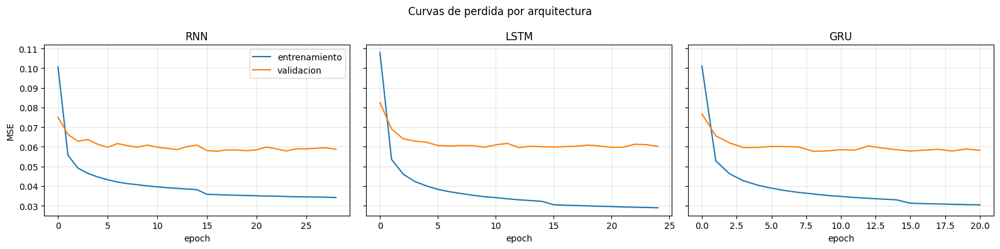

In [32]:
# Curvas de perdida de entrenamiento y validacion, una al lado de la otra por arquitectura.
fig, axes = plt.subplots(1, 3, figsize=(16, 4), sharey=True)
for ax, (nombre_arq, info) in zip(axes, resultados_finales.items()):
    hist = info["historial"]
    ax.plot(hist["loss"], label="entrenamiento")
    ax.plot(hist["val_loss"], label="validacion")
    ax.set_title(nombre_arq)
    ax.set_xlabel("epoch")
    ax.grid(True, alpha=0.3)
axes[0].set_ylabel("MSE")
axes[0].legend()
plt.suptitle("Curvas de perdida por arquitectura")
plt.tight_layout()
plt.show()


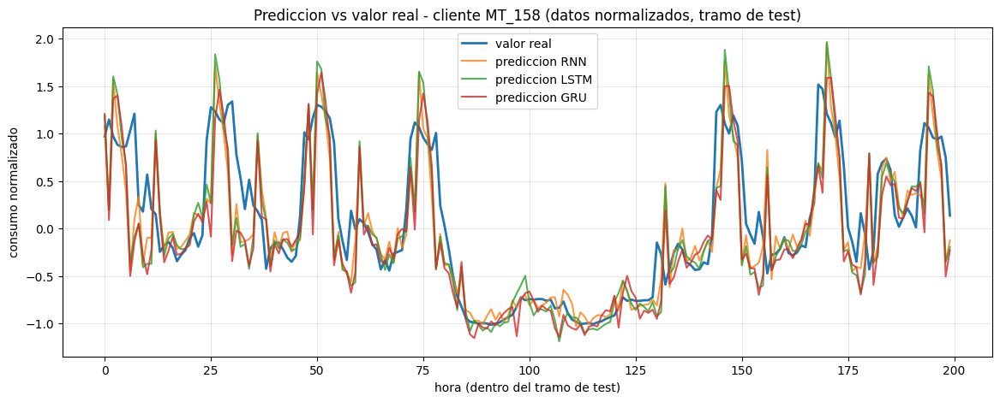

In [33]:
# Comparacion visual de predicciones vs valores reales, para un cliente puntual,
# sobre las primeras 200 horas del conjunto de test.
cliente_a_mostrar = 0  # indice dentro de la lista de clientes seleccionados
tramo = slice(0, 200)

plt.figure(figsize=(14, 5))
plt.plot(reales[tramo, cliente_a_mostrar], label="valor real", linewidth=2)
for nombre_arq, preds in predicciones_por_modelo.items():
    plt.plot(preds[tramo, cliente_a_mostrar], label=f"prediccion {nombre_arq}", alpha=0.8)

plt.title(f"Prediccion vs valor real - cliente {clientes_seleccionados[cliente_a_mostrar]} "
          f"(datos normalizados, tramo de test)")
plt.xlabel("hora (dentro del tramo de test)")
plt.ylabel("consumo normalizado")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()


## Lectura de resultados

Algunas cosas que suele mostrar este tipo de comparacion (los numeros exactos van a depender de
los clientes elegidos al azar y de la configuracion de hiperparametros que haya ganado la
busqueda, pero las tendencias generales suelen sostenerse):

- La **RNN simple** normalmente entrena mas rapido por epoch y tiene menos parametros, pero le
  cuesta mas capturar patrones que dependen de informacion lejana en el tiempo (el problema del
  *vanishing gradient* que mencionamos en la parte teorica): su MSE de test suele terminar un
  escalon por encima de LSTM y GRU.
- La **LSTM** suele ser la que mejor generaliza en series con patrones mas complejos, a costa de
  tener mas parametros y tardar mas por epoch.
- La **GRU** suele quedar en un punto intermedio: rendimiento parecido al de la LSTM, pero con
  menos parametros y entrenamientos algo mas rapidos, gracias a que fusiona las compuertas de
  olvido y entrada en una sola.

Vale la pena mirar la tabla comparativa y las curvas de perdida de esta ejecucion en particular
antes de sacar conclusiones definitivas: al ser un dataset real (no sintetico), el resultado
puede variar segun que clientes hayan quedado seleccionados al azar en el preprocesamiento.


# PARTE 9 - Conclusiones

En este cuadernillo armamos un pipeline completo, desde datos crudos hasta comparacion de
arquitecturas:

1. Descargamos y limpiamos el dataset real `ElectricityLoadDiagrams20112014`, seleccionando un
   subconjunto de clientes sin datos faltantes disfrazados de ceros.
2. Redujimos la resolucion temporal a datos horarios para que el volumen de datos fuera
   manejable en una GPU de 8 GB, sin perder por eso el requisito de tener mas de 20.000 muestras
   de entrenamiento.
3. Dividimos los datos de forma temporal (no aleatoria) en train/val/test, y normalizamos
   ajustando el escalador unicamente con el tramo de entrenamiento, para evitar fuga de
   informacion del futuro.
4. Construimos ventanas deslizantes multivariadas (24 horas de historia -> prediccion de la
   hora siguiente, para los 25 clientes a la vez).
5. Aplicamos el checklist completo de la guia: comprobacion de dimensiones, memorizacion de una
   muestra y de un batch, busqueda de hiperparametros en un subconjunto chico, y recien despues
   entrenamiento final sobre todos los datos.
6. Entrenamos RNN, LSTM y GRU con exactamente la misma receta (mismo optimizador `AdamW`, mismo
   scheduler, mismo dropout, mismo early stopping y checkpointing) para que la comparacion entre
   arquitecturas fuera lo mas justa posible, y comparamos los resultados en el conjunto de test.

Como siguientes pasos, si se quisiera seguir mejorando el modelo, tendria sentido probar
horizontes de prediccion mas largos (predecir varias horas hacia adelante en vez de solo una,
como se hizo en la segunda mitad del notebook `rnn_forecast`), agregar variables de calendario
(hora del dia, dia de la semana) como features adicionales, o probar arquitecturas hibridas
como una capa convolucional seguida de la capa recurrente.
